<a href="https://colab.research.google.com/github/audwls4545/metaverse/blob/main/orange_resnet34_version_4_new_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install koreanize-matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 78.7 MB/s eta 0:00:00


In [2]:
import matplotlib.pyplot as plt
import koreanize_matplotlib

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, models, transforms
import numpy as np
import time

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [5]:
import os
import shutil

directory_list = [
    './dataset/train/',
    './dataset/test/'
]

for dir in directory_list:
    if not os.path.isdir(dir):
        os.makedirs(dir)

In [6]:
#수집한 이미지를 학습데이터 평가데이터로 구분하는 함수
import glob

input_path = "/content/drive/MyDrive/colab_data_file/dataset/"

def dataset_split(query,train_cnt):

    for dir in directory_list:
        if not os.path.isdir(dir+query):
            os.makedirs(dir+query)

    cnt = 0
    for file_name in os.listdir(input_path+query):
        #print(file_name)
        if cnt < train_cnt:
            print(f'trainset : {file_name}')
            shutil.copy(input_path+query+'/'+file_name,'./dataset/train/'+query+'/'+file_name)
        else:
            print(f'testset : {file_name}')
            shutil.copy(input_path+query+'/'+file_name,'./dataset/test/'+query+'/'+file_name)

        cnt += 1

    #shutil.rmtree(query)

In [7]:
dataset_split('귤',40)
dataset_split('천혜향',40)
dataset_split('한라봉',40)
dataset_split('레드향',40)
dataset_split('자몽',40)

trainset : image_1.jpg
trainset : image_2.jpg
trainset : image_3.jpg
trainset : image_4.jpg
trainset : image_5.png
trainset : image_6.png
trainset : image_7.JPG
trainset : image_8.JPG
trainset : image_9.jpg
trainset : image_10.jpg
trainset : image_11.jpg
trainset : image_12.jpg
trainset : image_13.png
trainset : image_14.png
trainset : image_15.png
trainset : image_16.jpg
trainset : image_17.jpg
trainset : image_18.jpg
trainset : image_19.jpg
trainset : image_20.jpg
trainset : image_21.jpg
trainset : image_22.jpg
trainset : image_23.jpg
trainset : image_24.jpg
trainset : image_25.jpg
trainset : image_26.jpg
trainset : image_27.jpg
trainset : image_28.jpg
trainset : image_29.jpg
trainset : image_30.JPG
trainset : image_31.JPG
trainset : image_32.jpg
trainset : image_33.jpg
trainset : image_34.jpg
trainset : image_35.jpg
trainset : image_36.jpg
trainset : image_37.jpg
trainset : image_38.jpg
trainset : image_41.png
trainset : image_39.jpg
testset : image_40.JPG
testset : image_42.JPG
tes

In [9]:
transform_train = transforms.Compose([
    #transforms.RandomResizedCrop(size=(224,224), ratio=(3/4,4/3)),
    #transforms.RandomRotation(degrees=(-30,30)),
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

transform_test = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

In [10]:
train_datasets = datasets.ImageFolder('./dataset/train',transform_train)
test_datasets = datasets.ImageFolder('./dataset/test',transform_test)

In [11]:
train_dataloader = torch.utils.data.DataLoader(train_datasets,shuffle=True,batch_size=4)
test_dataloader = torch.utils.data.DataLoader(test_datasets,shuffle=True,batch_size=4)

In [12]:
def imshow(img, title):
    print(img.numpy().shape) #tensor를 numpy로 변환
    img = img.numpy().transpose((1,2,0)) #w,h,c

    std = np.array([0.229,0.224,0.225])
    mean = np.array([0.485,0.456,0.406])

    img = std * img + mean
    img = np.clip(img,0,1)

    plt.imshow(img)
    plt.title(title)
    plt.show()

In [13]:
class_names = train_datasets.classes
print('클래스:', class_names)

클래스: ['귤', '레드향', '자몽', '천혜향', '한라봉']


(3, 228, 906)


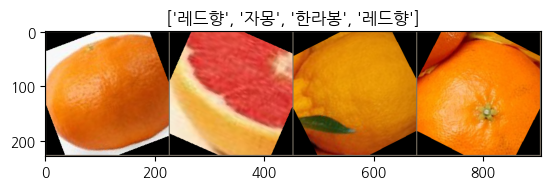

In [14]:
iter_ = iter(train_dataloader)

data, labels = next(iter_)
out = torchvision.utils.make_grid(data)

imshow(out,title=[class_names[x] for x in labels])

In [15]:
model = models.resnet34(pretrained=True)
print(model)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 82.5MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [16]:
for param in model.parameters():
    param.requires_grad = False

fc_input_features = model.fc.in_features
fc_input_features

512

In [17]:
model.fc = nn.Linear(fc_input_features, 5)

for name,module in model.named_parameters():
    print(name , module.requires_grad)

conv1.weight False
bn1.weight False
bn1.bias False
layer1.0.conv1.weight False
layer1.0.bn1.weight False
layer1.0.bn1.bias False
layer1.0.conv2.weight False
layer1.0.bn2.weight False
layer1.0.bn2.bias False
layer1.1.conv1.weight False
layer1.1.bn1.weight False
layer1.1.bn1.bias False
layer1.1.conv2.weight False
layer1.1.bn2.weight False
layer1.1.bn2.bias False
layer1.2.conv1.weight False
layer1.2.bn1.weight False
layer1.2.bn1.bias False
layer1.2.conv2.weight False
layer1.2.bn2.weight False
layer1.2.bn2.bias False
layer2.0.conv1.weight False
layer2.0.bn1.weight False
layer2.0.bn1.bias False
layer2.0.conv2.weight False
layer2.0.bn2.weight False
layer2.0.bn2.bias False
layer2.0.downsample.0.weight False
layer2.0.downsample.1.weight False
layer2.0.downsample.1.bias False
layer2.1.conv1.weight False
layer2.1.bn1.weight False
layer2.1.bn1.bias False
layer2.1.conv2.weight False
layer2.1.bn2.weight False
layer2.1.bn2.bias False
layer2.2.conv1.weight False
layer2.2.bn1.weight False
layer2.2.bn1

In [18]:
%matplotlib inline
!pip install tensorboardX

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 304.5/304.5 kB 29.7 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3


In [19]:
# SummaryWriter 인스턴스 생성
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

In [27]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)
model.to(device)
start_time = time.time()
for epoch in range(50):
    for data,labels in train_dataloader:
        optimizer.zero_grad()
        preds = model(data.to(device))
        loss = nn.CrossEntropyLoss()(preds,labels.to(device).data)
        loss.backward()
        optimizer.step()

    print(f'epoch : {epoch+1} loss : {loss.item()} time : {time.time() - start_time}')
    writer.add_scalar("Loss/train", loss.item(), epoch+1 )


epoch : 1 loss : 1.558518648147583 time : 2.3005285263061523
epoch : 2 loss : 0.6359237432479858 time : 4.213324069976807
epoch : 3 loss : 1.128868579864502 time : 6.1475725173950195
epoch : 4 loss : 1.2378991842269897 time : 8.202936887741089
epoch : 5 loss : 0.9292883276939392 time : 10.147129774093628
epoch : 6 loss : 0.708828330039978 time : 12.599394798278809
epoch : 7 loss : 0.602998673915863 time : 15.089527368545532
epoch : 8 loss : 0.7926867008209229 time : 17.02604603767395
epoch : 9 loss : 1.1614633798599243 time : 18.887121438980103
epoch : 10 loss : 0.7913371324539185 time : 20.70348882675171
epoch : 11 loss : 1.2238284349441528 time : 22.527162551879883
epoch : 12 loss : 0.984237790107727 time : 24.433399200439453
epoch : 13 loss : 0.395443856716156 time : 27.039561986923218
epoch : 14 loss : 0.45595720410346985 time : 29.312410354614258
epoch : 15 loss : 1.2022547721862793 time : 31.244961738586426
epoch : 16 loss : 0.7418911457061768 time : 33.13545370101929
epoch : 17 

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


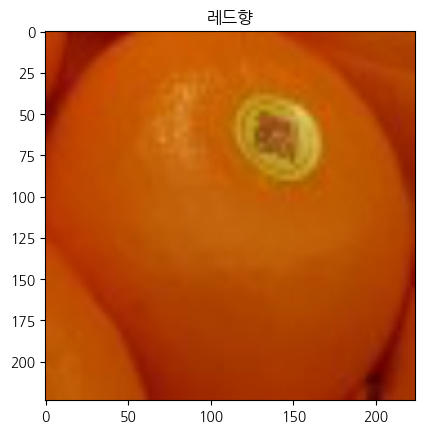

예측결과 : 귤  실제정답 : 한라봉
(3, 224, 224)


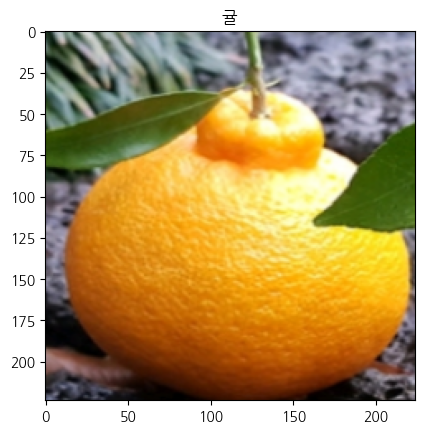

예측결과 : 귤  실제정답 : 레드향
(3, 224, 224)


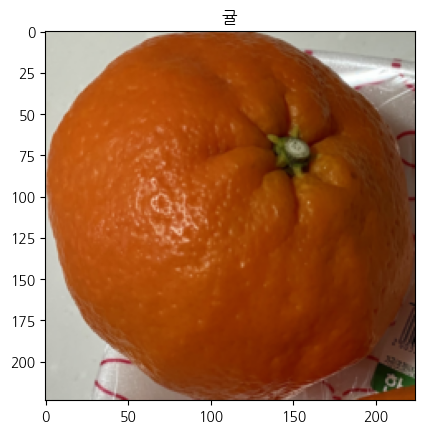

예측결과 : 레드향  실제정답 : 귤
(3, 224, 224)


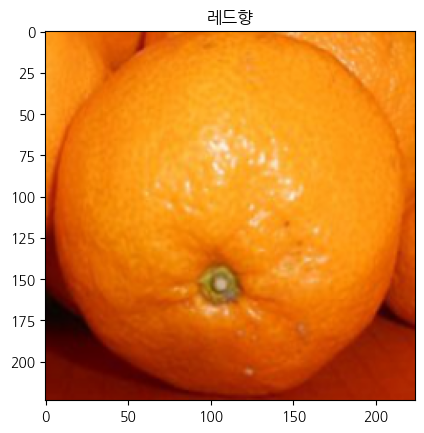

예측결과 : 귤  실제정답 : 레드향
(3, 224, 224)


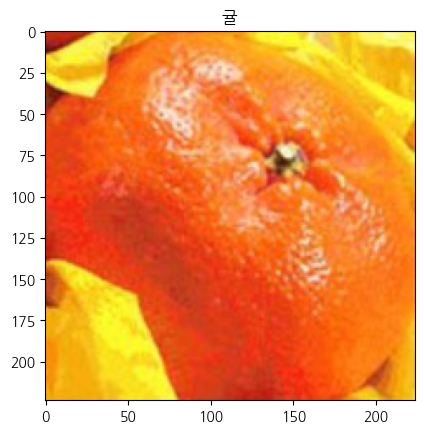

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


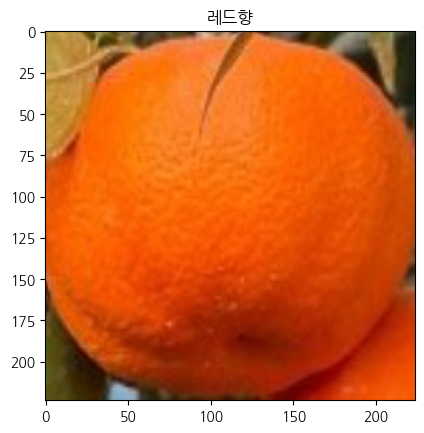

예측결과 : 천혜향  실제정답 : 천혜향
(3, 224, 224)


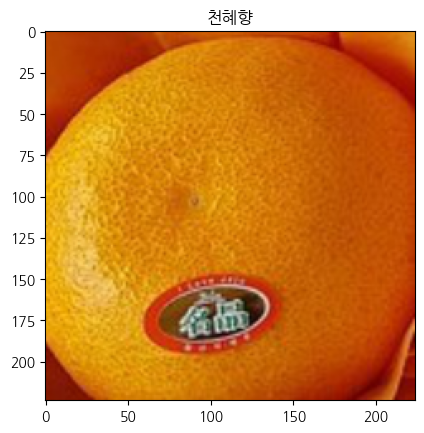

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


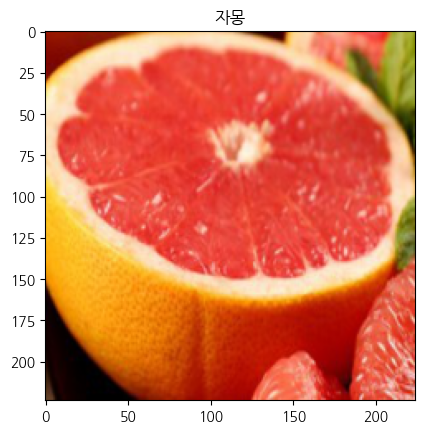

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


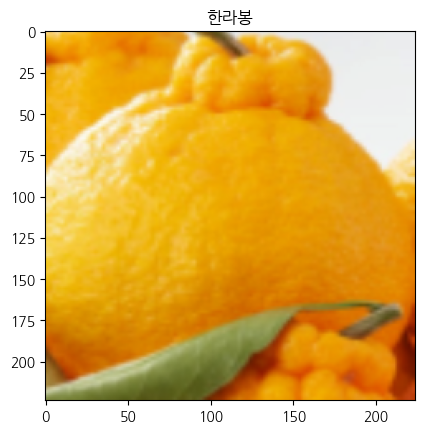

예측결과 : 천혜향  실제정답 : 천혜향
(3, 224, 224)


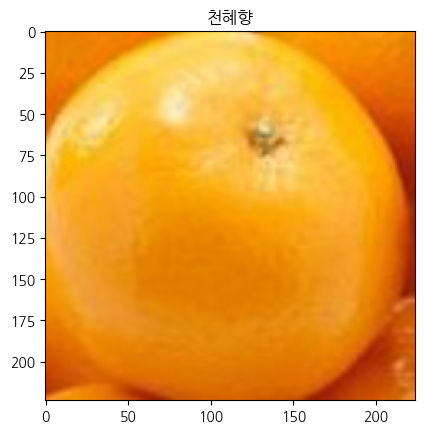

예측결과 : 귤  실제정답 : 귤
(3, 224, 224)


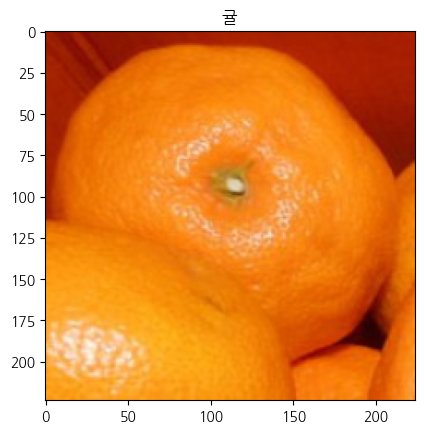

예측결과 : 귤  실제정답 : 귤
(3, 224, 224)


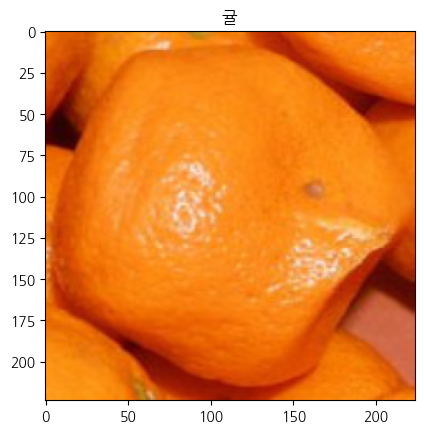

예측결과 : 레드향  실제정답 : 천혜향
(3, 224, 224)


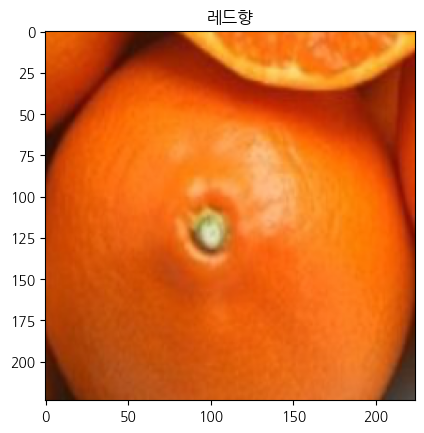

정확도 : 62.0


In [28]:
model.eval()

with torch.no_grad():
    corrects = 0
    for data,labels in test_dataloader:
        preds = model(data.to(device))
        pred = torch.max(preds,1)[1]

        corrects += torch.sum(pred == labels.to(device).data)

        print(f'예측결과 : {class_names[pred[0]]}  실제정답 : {class_names[labels.data[0]]}')
        imshow(data.cpu().data[0], title=class_names[pred[0]])

    acc = corrects / len(test_datasets) * 100
    print(f'정확도 : {acc}')

In [29]:
# 쓰기 종료
writer.close()

#코랩 안에서 띄우기위함
%load_ext tensorboard
#경로로 불러오기
%tensorboard --logdir=runs
# %tensorboard --logdir [경로] --port [포트번호]

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 4458), started 0:05:32 ago. (Use '!kill 4458' to kill it.)

<IPython.core.display.Javascript object>

In [23]:
torch.save(model.state_dict(),'orange_resnet34_version_4_new_data.pth')

In [24]:
from google.colab import files
files.download('/content/orange_resnet34_version_4_new_data.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>